In [1]:
!wget https://people.eecs.berkeley.edu/~tinghuiz/projects/pix2pix/datasets/facades.tar.gz
!tar -xzvf facades.tar.gz

--2019-08-29 02:55:57--  https://people.eecs.berkeley.edu/~tinghuiz/projects/pix2pix/datasets/facades.tar.gz
Resolving people.eecs.berkeley.edu (people.eecs.berkeley.edu)... 128.32.189.73
Connecting to people.eecs.berkeley.edu (people.eecs.berkeley.edu)|128.32.189.73|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 30168306 (29M) [application/x-gzip]
Saving to: ‘facades.tar.gz.8’

facades.tar.gz.8    100%[===================>]  28.77M  12.9MB/s    in 2.2s    

2019-08-29 02:55:59 (12.9 MB/s) - ‘facades.tar.gz.8’ saved [30168306/30168306]

facades/
facades/test/
facades/test/27.jpg
facades/test/5.jpg
facades/test/72.jpg
facades/test/1.jpg
facades/test/10.jpg
facades/test/100.jpg
facades/test/101.jpg
facades/test/102.jpg
facades/test/103.jpg
facades/test/104.jpg
facades/test/105.jpg
facades/test/106.jpg
facades/test/11.jpg
facades/test/12.jpg
facades/test/13.jpg
facades/test/14.jpg
facades/test/15.jpg
facades/test/16.jpg
facades/test/17.jpg
facades/test/18.jpg
fa

In [0]:
import random
import matplotlib.pyplot as plt
import os, time, itertools, imageio, pickle
import tensorflow as tf
import numpy as np

In [0]:

tf.reset_default_graph()

In [0]:
def leaky_relu(X, leak = 0.3):
    f1 = 0.5 * (1 + leak)
    f2  = 0.5 * (1-leak)
    return f1*X + f2*tf.abs(X)

w_init = tf.truncated_normal_initializer(mean = 0.0, stddev = 0.02)
b_init = tf.constant_initializer(1.0)

def generator(x, isTrain = True, reuse = False):
    with tf.variable_scope('generator', reuse = reuse):
        
        
        # encoder
        conv1 = leaky_relu(tf.layers.conv2d(x, 64, [4,4], strides = (2,2), padding = 'same',kernel_initializer = w_init, bias_initializer = b_init))
        
        conv2 = leaky_relu(tf.layers.batch_normalization(tf.layers.conv2d(conv1,128,[4,4],strides=(2,2),padding='same', kernel_initializer=w_init,bias_initializer=b_init),training=isTrain))
        
        conv3 = leaky_relu(tf.layers.batch_normalization(tf.layers.conv2d(conv2, 256, [4,4], strides = (2,2),padding = 'same',kernel_initializer = w_init, bias_initializer=b_init), training = isTrain))
        
        conv4 = leaky_relu(tf.layers.batch_normalization(tf.layers.conv2d(conv3, 512, [4,4], strides = (2,2),padding = 'same',kernel_initializer = w_init,bias_initializer=b_init),training = isTrain))
        
        
        conv5 = leaky_relu(tf.layers.batch_normalization(tf.layers.conv2d(conv4, 512, [4,4], strides = (2,2), padding = 'same', kernel_initializer = w_init, bias_initializer=b_init),training = isTrain))
        
        
        conv6 = leaky_relu(tf.layers.batch_normalization(tf.layers.conv2d(conv5, 512, [4,4], strides = (2,2), padding = 'same',kernel_initializer = w_init, bias_initializer=b_init), training = isTrain))
        
        
        
        conv7 = leaky_relu(tf.layers.batch_normalization(tf.layers.conv2d(conv6, 512, [4,4], strides = (2,2), padding = 'same',kernel_initializer = w_init, bias_initializer=b_init), training = isTrain))
        
        
         
        conv8 = tf.nn.relu(tf.layers.conv2d(conv7, 512, [4,4], strides = (2,2), padding = 'same', kernel_initializer = w_init, bias_initializer=b_init))
        
        #decoder and skip connections
        
        deconv1 = tf.nn.dropout(tf.layers.batch_normalization(tf.layers.conv2d_transpose(conv8, 512, [4,4], strides = (2,2), padding = 'same', kernel_initializer= w_init,bias_initializer= b_init), training = isTrain), keep_prob = 0.5)
        
        deconv1 = tf.nn.relu(tf.concat([deconv1, conv7], 3))

        deconv2 = tf.nn.dropout(tf.layers.batch_normalization(tf.layers.conv2d_transpose(deconv1, 512, [4,4],strides = (2,2), padding = 'same', kernel_initializer= w_init,bias_initializer= b_init), training = isTrain), keep_prob = 0.5)
        
        deconv2 = tf.nn.relu(tf.concat([deconv2, conv6], 3))
 
        deconv3 = tf.nn.dropout(tf.layers.batch_normalization(tf.layers.conv2d_transpose(deconv2, 512, [4,4],strides = (2,2), padding = 'same', kernel_initializer= w_init,bias_initializer= b_init), training = isTrain), keep_prob = 0.5)
        
        deconv3 = tf.nn.relu(tf.concat([deconv3, conv5], 3))
        
        
        deconv4 = tf.layers.batch_normalization(tf.layers.conv2d_transpose(deconv3, 512, [4,4], strides = (2,2), padding = 'same', kernel_initializer= w_init,bias_initializer= b_init), training = isTrain)
        
        deconv4 = tf.nn.relu(tf.concat([deconv4, conv4], 3))

        
        deconv5 = tf.layers.batch_normalization(tf.layers.conv2d_transpose(deconv4, 256, [4,4],strides = (2,2), padding = 'same', kernel_initializer= w_init, bias_initializer= b_init), training = isTrain)
        
        deconv5 = tf.nn.relu(tf.concat([deconv5, conv3], 3))

        
        deconv6 = tf.layers.batch_normalization(tf.layers.conv2d_transpose(deconv5, 128, [4,4],strides = (2,2), padding = 'same', kernel_initializer= w_init,bias_initializer= b_init), training = isTrain)
        
        deconv6 = tf.nn.relu(tf.concat([deconv6, conv2], 3))
        
        deconv7 = tf.layers.batch_normalization(tf.layers.conv2d_transpose(deconv6, 64, [4,4],strides = (2,2), padding = 'same', kernel_initializer= w_init,bias_initializer= b_init), training = isTrain)
        
        deconv7 = tf.nn.relu(tf.concat([deconv7, conv1], 3))
        
        
        deconv8 = tf.nn.tanh(tf.layers.conv2d_transpose(deconv7, 3, [4,4], strides = (2,2), padding = 'same', kernel_initializer = w_init, bias_initializer= b_init))
        
        
        return deconv8
    
    
    
def discriminator(x, y, isTrain = True, reuse = False):
    with tf.variable_scope('discriminator', reuse = reuse):
        
        cat1 = tf.concat([x, y], 3)
        
        conv1 = leaky_relu(tf.layers.conv2d(cat1, 64, [4,4], strides = (2,2), padding = 'same',kernel_initializer = w_init, bias_initializer = b_init))
        
        conv2 = leaky_relu(tf.layers.batch_normalization(tf.layers.conv2d(conv1, 128, [4,4], strides = (2,2), padding = 'same', kernel_initializer= w_init, bias_initializer= b_init), training= isTrain))
        
        conv3 = tf.layers.batch_normalization(tf.layers.conv2d(conv2, 256, [4,4], strides = (2,2), padding = 'same', kernel_initializer= w_init,bias_initializer= b_init), training= isTrain)
        
        
        conv3 = leaky_relu(tf.pad(conv3, [[0,0], [1,1],[1,1], [0,0]], mode = "CONSTANT"))
        
        
        conv4 = tf.layers.batch_normalization(tf.layers.conv2d(conv3, 512, [4,4], strides = (1,1), padding = 'valid', kernel_initializer= w_init, bias_initializer= b_init), training= isTrain)
        
        conv4 = leaky_relu(tf.pad(conv4, [[0,0], [1,1], [1,1], [0,0]], mode = "CONSTANT"))
        
    
        conv5 = tf.layers.conv2d(conv4, 1, [4,4], strides = (1,1), padding = 'valid', kernel_initializer=w_init, bias_initializer= b_init)
        
        out = tf.nn.sigmoid(conv5)   # gives a 30*30 patchGAN
        
        return out, conv5
        
        
        
        
        
        
        
        

In [0]:
class data_loader:
    def __init__(self, root, batch_size = 1, shuffle = False):
        self.root = root
        self.batch_size = batch_size
        self.file_list = os.listdir(self.root)
        if (shuffle):
            self.file_list = list(np.array(self.file_list)[random.sample(range(0, len(self.file_list)), 
                                                                        len(self.file_list))])
            
        img = plt.imread(self.root + '/' + self.file_list[0])
        self.shape= (len(self.file_list), img.shape[0], img.shape[1], img.shape[2])
        self.flag = 0
        
    
    def next_batch(self):
        if(self.flag  + self.batch_size > self.shape[0]):
            self.file_list = list(np.array(self.file_list)[random.sample(range(0, len(self.file_list)), 
                                                                        len(self.file_list))])
            self.flag = 0
            
        output = np.zeros((self.batch_size, self.shape[1], self.shape[2], self.shape[3]))
        temp = 0
        
        for i in range(self.flag, self.flag + self.batch_size):
            output[temp] = plt.imread(self.root + '/' + self.file_list[i])
            temp = temp +1
            
        self.flag +=self.batch_size
        
        return output

In [0]:
DATA_PATH = "facades/"
batch_size = 16

In [0]:
train = data_loader(DATA_PATH + "train", batch_size, shuffle = True)
test = data_loader(DATA_PATH + "test", batch_size, shuffle = True)

In [8]:
test_img = test.next_batch()
img_size = test_img.shape[1]
channels = 3
l1_weight = 100.0
test_img.shape
#print(img_size)

(16, 256, 512, 3)

In [0]:
x = tf.placeholder(tf.float32, shape = (None, img_size, img_size, channels))
y = tf.placeholder(tf.float32, shape = (None, img_size, img_size, channels))

In [10]:
test_x = test_img[:, :, img_size:, :]
test_y_ = test_img[:, :, 0:img_size, :]
print(test_x.shape)
print(test_y_.shape)

(16, 256, 256, 3)
(16, 256, 256, 3)


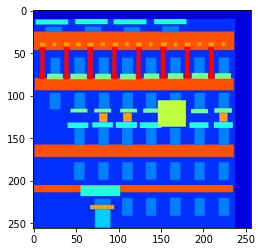

In [11]:
plt.imshow(test_x[7].astype(np.uint8))
plt.show()

In [12]:
G_x = generator(x)
D_real_outputs, D_real_logits = discriminator(x, y)
D_fake_outputs, D_fake_logits = discriminator(x, G_x, reuse = True)

D_loss_real = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits = D_real_logits, 
                                                                    labels = tf.ones_like(D_real_logits)))

D_loss_fake = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits = D_fake_logits, 
                                                                    labels = tf.ones_like(D_fake_logits)))

D_loss = D_loss_fake + D_loss_real

G_loss_gan = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits = D_fake_logits,
                                                                   labels = tf.ones_like(D_fake_logits)))

G_l1_loss = tf.reduce_mean(tf.reduce_sum(tf.abs(G_x-y), 3))

G_loss = G_loss_gan + G_l1_loss * l1_weight
                           


W0829 02:56:05.232192 139635822708608 deprecation.py:323] From <ipython-input-4-e83bc25a49f4>:14: conv2d (from tensorflow.python.layers.convolutional) is deprecated and will be removed in a future version.
Instructions for updating:
Use `tf.keras.layers.Conv2D` instead.
W0829 02:56:05.441677 139635822708608 deprecation.py:323] From <ipython-input-4-e83bc25a49f4>:16: batch_normalization (from tensorflow.python.layers.normalization) is deprecated and will be removed in a future version.
Instructions for updating:
Use keras.layers.BatchNormalization instead.  In particular, `tf.control_dependencies(tf.GraphKeys.UPDATE_OPS)` should not be used (consult the `tf.keras.layers.batch_normalization` documentation).
W0829 02:56:05.884984 139635822708608 deprecation.py:323] From <ipython-input-4-e83bc25a49f4>:38: conv2d_transpose (from tensorflow.python.layers.convolutional) is deprecated and will be removed in a future version.
Instructions for updating:
Use `tf.keras.layers.Conv2DTranspose` inst

In [0]:
D_vars = tf.get_collection(tf.GraphKeys.TRAINABLE_VARIABLES, 'discriminator')
D_solver = tf.train.AdamOptimizer(learning_rate=0.0002,beta1=0.5).minimize(D_loss, var_list=D_vars)
G_solver = tf.train.AdamOptimizer(learning_rate=0.0002,beta1=0.5).minimize(G_loss, var_list=G_vars)



sess = tf.InteractiveSession()
tf.global_variables_initializer().run()

In [0]:
def norm(img):
  return (img - 127.5) / 127.5

test_x = norm(test_x)

def show_result(num_epoch):
  
  test_images = sess.run(G_x, {x: test_x})
  
  size_figure_grid  = 4
  
  fig, ax = plt.subplots(size_figure_grid, size_figure_grid, figsize = (10, 10))
  
  for i, j in itertools.product(range(size_figure_grid), range(size_figure_grid)):
    ax[i, j].get_xaxis().set_visible(False)
    ax[i, j].get_yaxis().set_visible(False)
    
  for k in range(size_figure_grid * size_figure_grid):
    i = k//size_figure_grid
    j = k%size_figure_grid
    
    ax[i, j].cla()
    a = np.reshape(test_images[k], (256, 256, 3))*255
    ax[i, j].imshow(a.astype(np.uint8))
    
  label = 'Epoch {0}'.format(num_epoch)
  
  fig.text(0.5, 0.04, label, ha = 'center')
  
  plt.show()

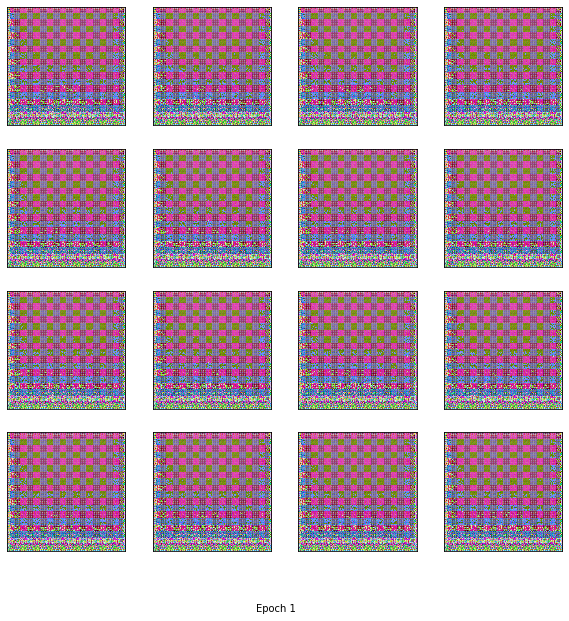

Iter: 0
D loss: 0.02598
G_loss: 189.6

The total time for epoch0 is56.867722034454346 


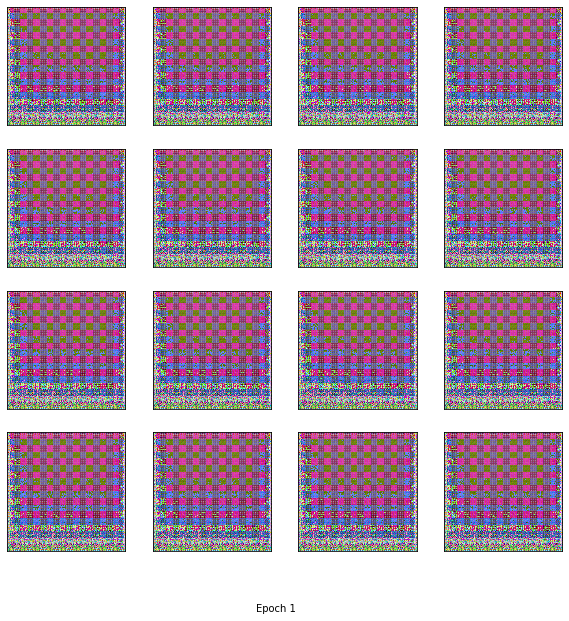

Iter: 0
D loss: 0.02009
G_loss: 178.0

The total time for epoch0 is113.63615465164185 


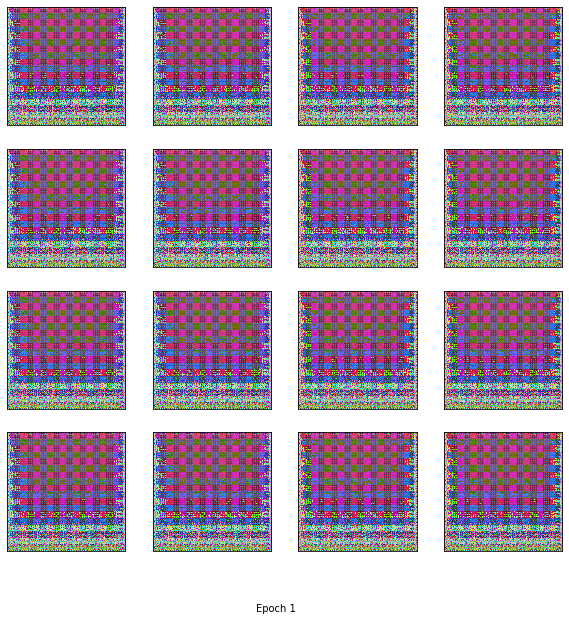

Iter: 0
D loss: 0.01804
G_loss: 177.8

The total time for epoch0 is170.29062819480896 


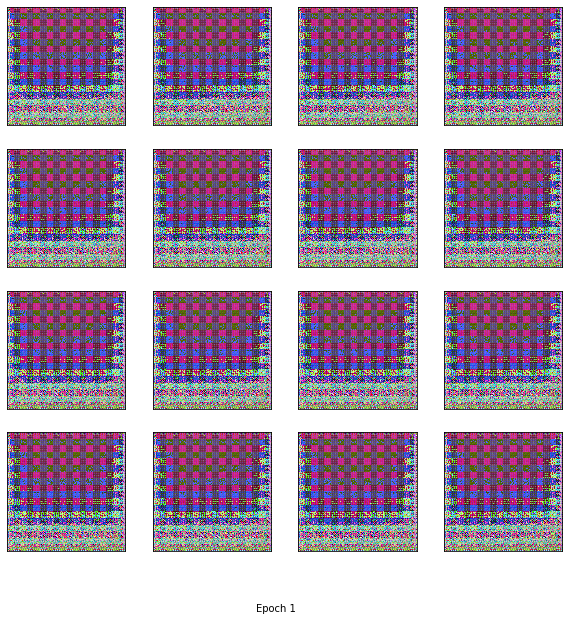

Iter: 0
D loss: 0.01573
G_loss: 148.5

The total time for epoch0 is227.38271260261536 


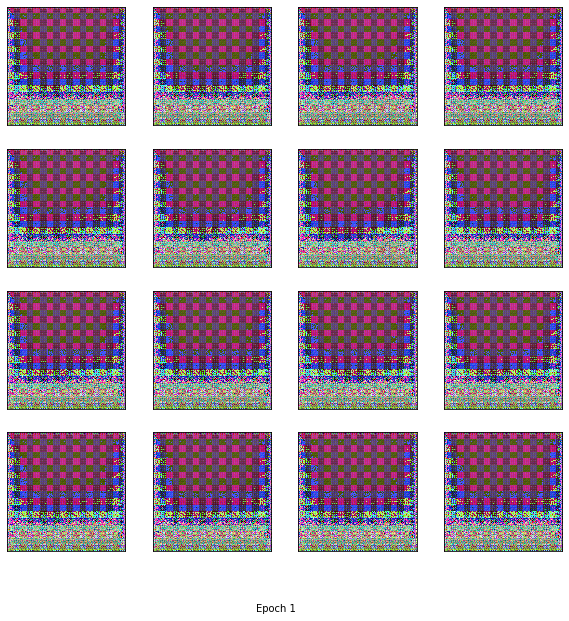

Iter: 0
D loss: 0.01421
G_loss: 149.9

The total time for epoch0 is283.7921860218048 


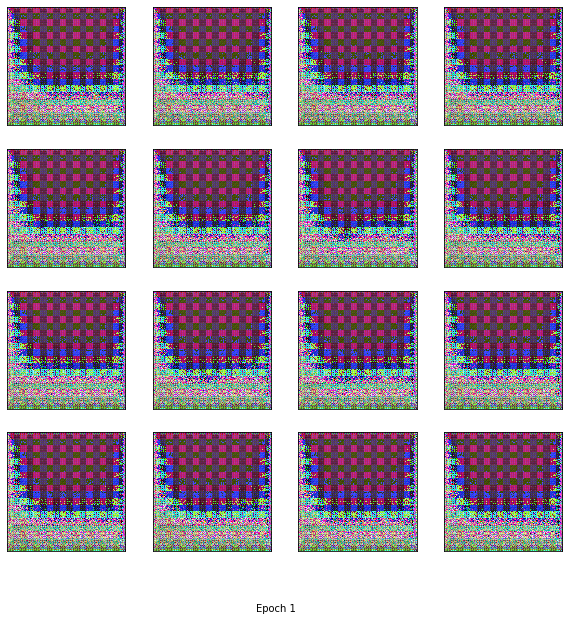

Iter: 0
D loss: 0.01288
G_loss: 150.6

The total time for epoch0 is339.9779939651489 


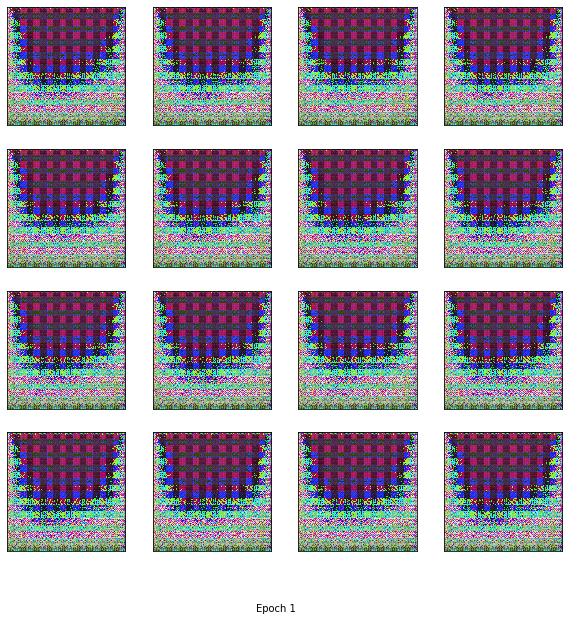

Iter: 0
D loss: 0.01218
G_loss: 140.4

The total time for epoch0 is395.875643491745 


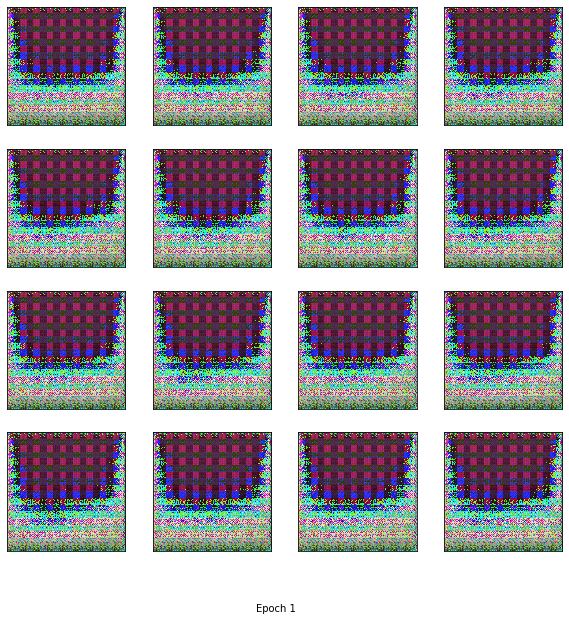

Iter: 0
D loss: 0.01174
G_loss: 119.8

The total time for epoch0 is451.72605752944946 


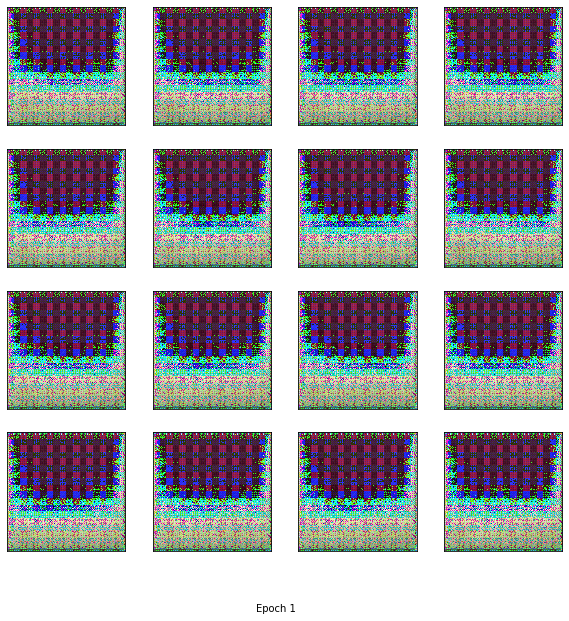

Iter: 0
D loss: 0.01046
G_loss: 125.1

The total time for epoch0 is508.05772709846497 


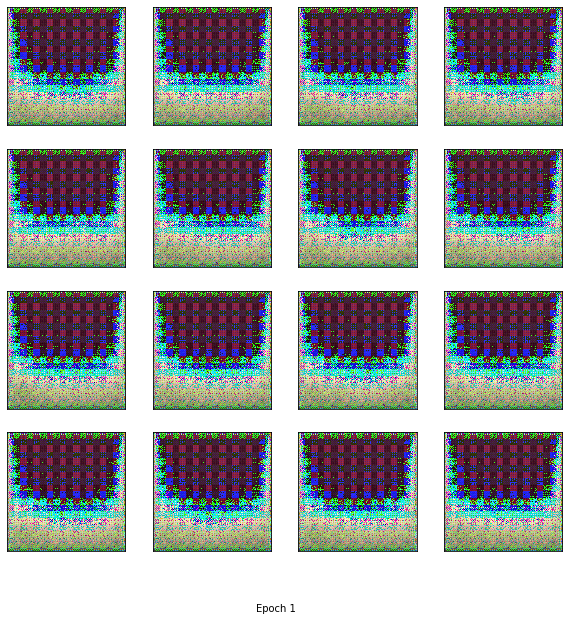

Iter: 0
D loss: 0.01007
G_loss: 119.3

The total time for epoch0 is564.2074744701385 


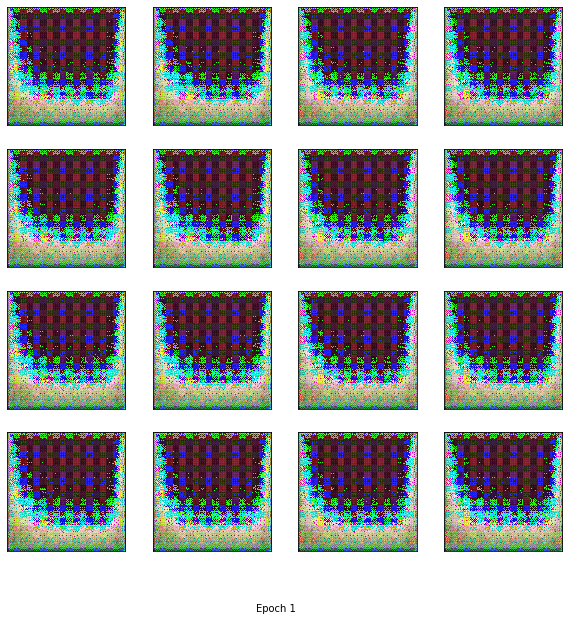

Iter: 0
D loss: 0.009357
G_loss: 124.1

The total time for epoch0 is621.9761829376221 


KeyboardInterrupt: ignored

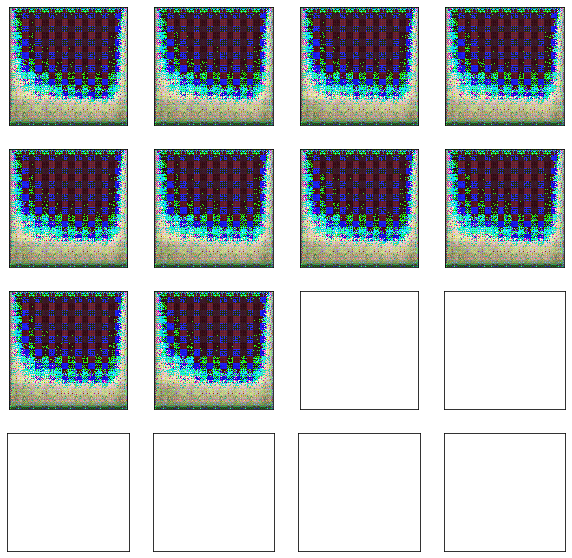

In [22]:
for it in range(200):
  epoch_start_time = time.time()
  
  for iter in range(train.shape[0] // batch_size):
    
    train_data = train.next_batch()
    
    train_x = norm(train_data[:, :, img_size:, :])
    train_y = norm(train_data[:, :, 0:img_size, :])
    
    _, D_loss_curr = sess.run([D_solver, D_loss], feed_dict = {x: train_x,y: train_y})
    
    _, G_loss_curr = sess.run([G_solver, G_loss], feed_dict = {x: train_x, y:train_y})
    
    if it % 1 == 0:
        
        show_result((it + 1))
        
        print('Iter: {}'.format(it))
        print('D loss: {:.4}'. format(D_loss_curr))
        print('G_loss: {:.4}'.format(G_loss_curr))
        print()
        
    epoch_end_time = time.time()
    per_epoch_ptime = epoch_end_time - epoch_start_time
    print("The total time for epoch{0} is{1} ".format(it,per_epoch_ptime))
    
    
    
    

In [0]:
_siz